# PATHWAY ABUNDANCE (fr now this time please)

## step 1: get all the packages in

In [ ]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import wesanderson
import re
from matplotlib import font_manager

## step 2: load all necessary data

In [ ]:
# bowtie hit summaries for propionate
compiled_bt_hit_summaries_allpathways = pd.read_csv("compiled_bt_hit_summaries_allpathways.csv")

# gene lengths 
allpathways_gene_catalogue_seqlengths = pd.read_csv("allpathways_gene_catalogue_seqlengths.csv").set_index("gene")

# gene information
allpathways_gene_info = pd.read_csv("allpathways_genesInCatalogue_long.csv")
allpathways_gene_info = allpathways_gene_info.drop(allpathways_gene_info.columns[0], axis=1).set_index("strain_gene")

## gene length correction (new, using formula proposed by RC, step 1 of it)

### the function for gene length correctin
note, this only does $hits\;of\;gene \cdot length(gene)$. The full formula is given as follows: $$

In [ ]:
def gene_length_correction_new(gene_catalogue_seqlengths, compiled_bt_hit_summaries):

    gene_length_df = gene_catalogue_seqlengths

    df = compiled_bt_hit_summaries.drop(["pathway"], axis=1).set_index("read_accession")

    new = df.copy()

    # first replace the values in new with the gene length of that gene
    for gene in compiled_bt_hit_summaries:
        
        if gene in gene_length_df.index:
        
            gene_length = gene_length_df.loc[gene].at["length"]

            new[gene] = [gene_length] * len(new)

    # equivalent to hits of gene * length(gene)
    new = df.multiply(new)

    return new

### running the code for gene length correction

In [ ]:
compiled_bt_hit_summaries_all_pathways_length_corrected = gene_length_correction_new(allpathways_gene_catalogue_seqlengths, compiled_bt_hit_summaries_allpathways)

## useful setup for calculating pathway abundances

In [ ]:
pathway_gene_lists = []
pathways = []
pathway_dict = {}
pathway_length_dict = {}

wrong_names_dict = {
    "P1_SP": "sodium-pumping decarboxylase",
    "P1_WWC": "Wood-Werkman Cycle",
    "P2": "acrylate pathway",
    "P3": "propanediol pathway"
}

# loop through the entire directory of gene lists
for file in os.listdir("geneLists"):

    file_n = "geneLists/" + str(file)

    # get the actual pathway from the filename
    pathway = str(file).replace("_gene_list.txt", "")

    if pathway in wrong_names_dict:
        pathway = wrong_names_dict[pathway]

    # get the list of genes in each file
    geneList = [line.rstrip() for line in open(file_n)]

    pathways.append(pathway)

    # this my way of bypassing that strange assign function from R
    pathway_dict[pathway] = geneList

    # pathway_length_dict[pathway + "_pathway_length"] = len(geneList)

    pathway_length_dict[pathway] = len(geneList)
    
    pathway_gene_lists.append(geneList)

# turn the gene pathways list of lists into a pandas dataframe, using `pathways` as the column names

gene_pathways_df = pd.DataFrame(pathway_gene_lists).transpose()

gene_pathways_df.columns = pathways

## calculating pathway abundances

### generate the dataframe to put everything in

## new approach: merge whatever RC has onto the final table

In [ ]:
def add_genes_in_catalogue(hit_table, gene_info, gene_catalogue_seqlengths):

    temp = hit_table.transpose()

    temp = temp.merge(gene_info, how="left", left_index=True, right_index=True)

    strain = temp.pop("strain")
    temp.insert(0, strain.name, strain)

    pathway = temp.pop("pathway")
    temp.insert(1, pathway.name, pathway)

    gene = temp.pop("gene")
    temp.insert(2, gene.name, gene)

    strain_pathway = temp.pop("strain_pathway")
    temp.insert(3, strain_pathway.name, strain_pathway)

    temp = temp.merge(gene_catalogue_seqlengths, how="left", left_index=True, right_index=True)

    length = temp.pop("length")
    temp.insert(4, length.name, length)

    return temp

In [ ]:
final_hit_table = add_genes_in_catalogue(compiled_bt_hit_summaries_all_pathways_length_corrected, allpathways_gene_info, allpathways_gene_catalogue_seqlengths)

## part 2 of length correction: dividing by number of hits for rplB

In [ ]:
def length_correction_denominator(hit_table):

    # grouped = hit_table.groupby("overall_pathway").sum().drop(["strain", "pathway", "gene", "strain_pathway", "length"], axis=1)

    grouped = hit_table.groupby("strain_pathway").sum().drop(["strain", "pathway", "gene", "length"], axis=1)

    rplB_sum = grouped.loc["housekeeping"]

    not_samples = ["strain", "pathway", "gene", "strain_pathway", "length"]

    new = hit_table.copy

    for read in grouped:

        hit_table[read] /= rplB_sum[read]

    return hit_table

In [ ]:
final_hit_table = length_correction_denominator(final_hit_table)

## this step is to normalise by proportion for the unknown samples

The formula for this normalisation is given as follows. Let $x$ be the amount of the mixed sample, $S_n$ be the known we are trying to approximate, and $S_i$ be the $i$-th known sample that is in the mixed sample. Let there be $n$ known samples in the mixed sample. As such, the total amount of $S_n$ can be given as follows:

$$actual\;amount\;of\;S_n = \frac{S_n}{\sum_{i=1}^{n} S_i} \cdot x$$

A function to perform this normalisation is given below.

In [ ]:
def normalise_unknown(df):

    new = df.copy()

    unknown_samples = {
        "acetylCoA_buk or glutarate_buk": ["acetylCoA_buk", "glutarate_buk"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "acetylCoA_buk or lysine": ["acetylCoA_buk", "lysine"],
        "acetylCoA_but or glutarate_but": ["acetylCoA_but", "glutarate_but"],
        "acetylCoA_but or glutarate_but or lysine": ["acetylCoA_but", "glutarate_but", "lysine"],
        "acetylCoA_but or lysine": ["acetylCoA_but", "lysine"],
        "aminobutyrate_buk or acetylCoA_buk": ["aminobutyrate_buk", "acetylCoA_buk"],
        "aminobutyrate_buk or acetylCoA_buk or lysine": ["aminobutyrate_buk", "acetylCoA_buk", "lysine"],
        "aminobutyrate_buk or lysine": ["aminobutyrate_buk", "lysine"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "aminobutyrate_but or acetylCoA_but or glutarate_but": ["aminobutyrate_but", "acetylCoA_but", "glutarate_but"]
    }

    for sample in df:

        for pathway in list(df.index):

            if " or " in pathway:

                unknown_proportion = df.loc[pathway].at[sample]

                if unknown_proportion == 0: break

                components_list = unknown_samples[pathway]
                proportion_dict = {}
                denominator = 0
                
                for component in components_list:

                    if df.loc[component].at[sample] != 0:

                        proportion_dict[component] = df.loc[component].at[sample]
                        denominator += proportion_dict[component]

                if len(proportion_dict) > 1:

                    for component in components_list:

                        new.loc[component].at[sample] = proportion_dict[component] + ((proportion_dict[component] / denominator) * unknown_proportion)

    new = new.drop(list(unknown_samples.keys()))

    return new

Now, actually implement the `normalisation_unknown` function on actual data

First, perform some preprocessing of the data

In [ ]:
overall_pathway_group = final_hit_table.groupby(["strain_pathway"]).sum()

overall_pathway_group = overall_pathway_group.drop(["strain", "pathway", "gene", "length"], axis=1).drop(["housekeeping"], axis=0)

Then, actually implement everything.

In [ ]:
noramlised_unknown_overall_pathway_group = normalise_unknown(overall_pathway_group)

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.reindex(columns= ["acetylCoA_buk", "acetylCoA_but", "aminobutyrate_buk", "aminobutyrate_but", "glutarate_buk", "glutarate_but", "lysine", "sodium-pumping decarboxylase", "Wood-Werkman Cycle", "acrylate pathway", "propanediol pathway"])

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group

### normalisation with respect to the length of each pathway

In [ ]:
noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

for pathway in noramlised_unknown_overall_pathway_group:

    if pathway in pathway_length_dict.keys():

        noramlised_unknown_overall_pathway_group[pathway] /= pathway_length_dict[pathway]

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group

### now add what the actual final pathways are

In [ ]:
def find_pathway(df):

    new = df.copy()

    prop_pathways = ["sodium-pumping decarboxylase", "Wood-Werkman Cycle", "propanediol pathway", "acrylate pathway"]

    butyrate_pathways = ["acetylCoA_buk", "aminobutyrate_buk", "lysine", "glutarate_but", "glutarate_buk", "acetylCoA_but", "aminobutyrate_but"]

    pathway_result = []

    for path in list(new.index):

        if path in prop_pathways: pathway_result.append("propionate")

        if path in butyrate_pathways: pathway_result.append("butyrate")

    new.insert(0, "overall_pathway", pathway_result)

    return new

In [ ]:
prop_but_groupby = find_pathway(noramlised_unknown_overall_pathway_group).groupby(["overall_pathway"]).sum()

prop_but_groupby

### add the stuff about metadata + species 

first load the species stuff in

In [ ]:
# # Load curated microbiome data
# 
# The original data is provided in R. Here, we use only the abundance data, provided in easily to handle csv files (subfolder data_curated_microbiome). The abundance levels were extracted from metagenomics using https://github.com/biobakery/MetaPhlAn.
# 
#big table with abundance of different species across all thousands of samples from the data collection
relab=pd.read_csv("data_curated_microbiome/relabundance.csv")
relab.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True) # Gives first column label "tax_identifier"
display(relab.head(3)) 

#information about samples
colnames=pd.read_csv("data_curated_microbiome/relabundance_colData.csv")
colnames.rename(columns={'Unnamed: 0': 'sample'},inplace=True) # Gives name to first column
# display(colnames.head(3))
# display(colnames.shape)

#information about different species detected in the different samples
rownames=pd.read_csv("data_curated_microbiome/relabundance_rowData.csv")
rownames.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True)
# display(rownames.head(3))
# display(rownames.shape)

#add species information to major data table. Used for groupby analysis later on
#relab.join
relab2 = relab.merge(rownames, on='tax_identifier', how='inner')  # Rows = species, Cols = Samples + species info
# relab2.to_csv("/Users/augustburton/Desktop/microbiota_composition/data_curated_microbiome/species_samples_table.csv")
display(relab2.head(3))

now add the metadata in

In [119]:
metadata = pd.read_csv("data_curated_microbiome/nayfach_asnicar_hmp_metadata.csv").set_index("NCBI_accession")

temp = prop_but_groupby.transpose()

with_metadata_prop_but_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_prop_but_normalised.to_csv("output/with_metadata_prop_but_normalised.csv")

In [120]:
temp = noramlised_unknown_overall_pathway_group.transpose()

with_metadata_overall_group_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_overall_group_normalised.to_csv("output/with_metadata_overall_group_normalised")

In [121]:
with_metadata_prop_but_normalised = pd.read_csv("output/with_metadata_prop_but_normalised.csv").set_index("Unnamed: 0.1")

with_metadata_overall_group_normalised = pd.read_csv("output/with_metadata_overall_group_normalised").set_index("Unnamed: 0.1")

In [ ]:
with_metadata_overall_group_normalised

In [122]:
healthy_overall_group_noramlised = with_metadata_overall_group_normalised.loc[with_metadata_overall_group_normalised['disease'] == "healthy"]

healthy_prop_but_noramlised = with_metadata_prop_but_normalised.loc[with_metadata_prop_but_normalised['disease'] == "healthy"]

adult_healthy_overall_group_normalised = healthy_overall_group_noramlised.loc[healthy_overall_group_noramlised["age_category"] == "adult"]

adult_health_prop_but_normalised = healthy_prop_but_noramlised.loc[healthy_prop_but_noramlised["age_category"] == "adult"]

In [123]:
adult_health_prop_but_normalised

,butyrate,propionate,Unnamed: 0,study_name,subject_id,body_site,antibiotics_current_use,study_condition,disease,age,...,ldl,hba1c,cholesterol,glucose,creatinine,bilubirin,prothrombin_time,wbc,rbc,hemoglobinometry
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
ERR4330026,1.588232,0.216712,SAMEA7041133,AsnicarF_2021,predict1_MTG_0001,stool,no,control,healthy,36.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ERR4330027,0.501034,0.060292,SAMEA7041134,AsnicarF_2021,predict1_MTG_0002,stool,no,control,healthy,24.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ERR4330028,1.059238,0.046011,SAMEA7041135,AsnicarF_2021,predict1_MTG_0003,stool,no,control,healthy,63.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ERR4330029,0.498821,0.034982,SAMEA7041136,AsnicarF_2021,predict1_MTG_0004,stool,no,control,healthy,53.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ERR4330030,0.776696,0.081753,SAMEA7041137,AsnicarF_2021,predict1_MTG_0005,stool,no,control,healthy,38.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR4052026,0.889437,0.147748,MV_FEM5_t1Q14,AsnicarF_2017,MV_FEM5,stool,NaN,control,healthy,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR4052027,0.323267,0.018144,MV_FEM5_t2Q14,AsnicarF_2017,MV_FEM5,stool,NaN,control,healthy,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SRR4052028,0.571603,0.059907,MV_FEM5_t3Q15,AsnicarF_2017,MV_FEM5,stool,NaN,control,healthy,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### make the stuff to account for phylum

In [ ]:
phylum_df = relab2.groupby("phylum").sum().drop(["superkingdom", "class", "order", "family", "genus", "species"], axis=1).reset_index().set_index("phylum").drop(["tax_identifier"], axis=1)

temp = phylum_df.transpose()

metadata = pd.read_csv("data_curated_microbiome/asnicar_metadata.csv").drop(["age", "infant_age", "age_category", "gender", "country", "non_westernized", "BMI"], axis=1).set_index("Unnamed: 0")

with_phylum = metadata.merge(temp, how="left", left_index=True, right_index=True).reset_index().set_index("NCBI_accession")

bacteroides_vs_firmicutes = with_phylum[["Bacteroidetes", "Firmicutes"]]

bacteroides_vs_firmicutes = bacteroides_vs_firmicutes.reindex(["Firmicutes", "Bacteroidetes"], axis="columns").transpose()

bacteroides_vs_firmicutes

## random plots testing time

### custom fonts because why not I'm annoying like that

In [ ]:
font_dirs = ["Hind"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

# set font
plt.rcParams['font.family'] = "Hind"

### defining functions to make some basic stacked bar plots

In [ ]:
def stackedBarDF(overall_pathway_df):

    temp_table = overall_pathway_df.transpose()

    temp_dict = {}

    for column in temp_table:

        temp_dict[column] = temp_table[column].tolist()

    samples_list = list(temp_table.index.values)

    plottingDF = pd.DataFrame(
        temp_dict,
        index = samples_list
    )

    return plottingDF.fillna(0) 

def plotStackedBar(stackedBarDF, name="overall pathway groupby", x_name="samples"):

    mpl.rcParams.update(mpl.rcParamsDefault)
    n = len(stackedBarDF.columns)
    colors = plt.cm.viridis(np.linspace(0, 1, n))

    plt.rcParams.update({'font.size': 35})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    plt.rcParams['font.family'] = "Hind"
    
    return stackedBarDF.plot(kind="bar", stacked=True, color=colors, figsize=(13,8), xlabel=x_name, ylabel="relative pathway abundance", title=name, xticks=([])).legend(loc="center left", bbox_to_anchor=(1, 0.5))
    
def sortedStackedBar(df, sortBy, auto_name=False, x_name="samples"):
    
    name = "Sorted by abundance of " + sortBy if not auto_name else ""

    return plotStackedBar(stackedBarDF(df).sort_values(by=sortBy), name, x_name)

def percentageNormalise(df):

    new = df.copy()
    summed = df.sum(axis=0)

    for row in df.index:
        new.loc[row] = df.loc[row].div(summed)

    return new

### defining stuff for scatter plots

In [141]:
def plotScatter(scatterDF, x_data, y_data):

    plt.rcParams.update({'font.size': 23})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    sns.set_style("darkgrid")

    name = "Proportions of " + x_data + " producers versus\n" + y_data + " producers for 1203 healthy adult samples"
    filename = x_data + "_vs_" + y_data
    
    fig = scatterDF.plot(kind="scatter", x=x_data, y=y_data, figsize=(15,6),colormap="viridis", xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

    plt.show()

def plotScatterContinuous(scatterDF, x_data, y_data, c_data):

    scatterDF = scatterDF.dropna(subset=[c_data], axis=0)

    plt.rcParams.update({'font.size': 20})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=600
    sns.set_style("darkgrid")

    name = x_data + " vs " + y_data + " with respect to " + c_data
    
    fig = scatterDF.plot(kind="scatter", x=x_data, y=y_data, c=c_data, colormap="viridis", alpha=0.7, figsize=(15,5), xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

def plotScatterDiscrete(scatterDF, x_data, y_data, c_data):

    name = x_data + " vs " + y_data + " with respect to " + c_data

    sns.reset_defaults()
    sns.set_style("darkgrid")
    plt.rcParams.update({'font.size': 20})

    plt.rcParams['figure.dpi']=600
    plt.figure(figsize=(14, 5))

    sns.set_palette(wesanderson.film_palette("darjeeling"))

    sns.scatterplot(data=scatterDF,x=x_data, y=y_data, hue=c_data, alpha=0.5).set(xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)
    plt.show()

In [ ]:
unsorted_normalised_final_graph = plotStackedBar(stackedBarDF(noramlised_unknown_overall_pathway_group), "group by overall pathway, unsorted, normalised")

In [ ]:
sort_acetylCoA_buk = sortedStackedBar(noramlised_unknown_overall_pathway_group, "acetylCoA_buk")

In [ ]:
sort_acetylCoA_but = sortedStackedBar(noramlised_unknown_overall_pathway_group, "acetylCoA_but", )

In [ ]:
sort_but_graph = sortedStackedBar(prop_but_groupby, "butyrate")

plt.show()

### making normalised percentage bar charts?

In [ ]:
overall_pathway_normalised_group_percent = percentageNormalise(noramlised_unknown_overall_pathway_group)

# unsorted_normalised_final_graph_percent = plotStackedBar(stackedBarDF(overall_pathway_normalised_group_percent), "unsorted, noramlised, overall pathway group")

In [ ]:
prop_but_percent = percentageNormalise(prop_but_groupby)

sort_but_normalised = sortedStackedBar(df=prop_but_percent, sortBy="butyrate", auto_name="title", x_name="1973 samples across the Asnicar, Nayfach, and HMP 2019 studies")


plt.show()
# sort_but_normalised = sortedStackedBar(df=prop_but_percent, sortBy="butyrate")

In [ ]:
temp = adult_health_prop_but_normalised[["butyrate", "propionate"]]

adult_health_prop_but_percent = percentageNormalise(temp.transpose())

adult_healthy_sort_but_normalised = sortedStackedBar(df=adult_health_prop_but_percent, sortBy="butyrate", auto_name="title", x_name="1203 healthy adult samples")

plt.show()

In [ ]:
adult_health_prop_but_percent

In [ ]:
sorted_acetylCoA_buk_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "acetylCoA_buk")

In [ ]:
sorted_acetylCoA_but_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "acetylCoA_but", title="Pathway Variations in Healthy Individuals", x_name="1973 samples across the Asnicar, Nayfach, and HMP 2019 studies")

In [ ]:
temp = adult_healthy_overall_group_normalised[["acetylCoA_buk", "acetylCoA_but", "aminobutyrate_buk", "aminobutyrate_but", "glutarate_buk", "glutarate_but", "lysine", "sodium-pumping decarboxylase", "acrylate pathway", "propanediol pathway"]]

adult_healthy_overall_group_percent = percentageNormalise(temp.transpose())

adult_healthy_sort_acetylCoA_normalised = sortedStackedBar(df=adult_healthy_overall_group_percent, sortBy="acetylCoA_but", auto_name="title", x_name="1203 healthy adult samples")

plt.show()

In [ ]:
sorted_propanediol_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "propanediol pathway")

In [ ]:
phylum_percentage_df = percentageNormalise(bacteroides_vs_firmicutes)

phylum_distribution_unsorted = plotStackedBar(stackedBarDF(phylum_percentage_df), "unsorted, noramlised, bacteroidetes vs firmicutes")

In [ ]:
sorted_bacteroidetes_normalised_percent = sortedStackedBar(phylum_percentage_df, "Firmicutes")

### scatter plots

In [ ]:
temp = adult_health_prop_but_normalised[["butyrate", "propionate"]]

healthy_adult_prop_vs_but_graph = plotScatter(temp, x_data="butyrate", y_data="propionate")
plt.show()

In [ ]:
prop_vs_but = prop_but_groupby.transpose()

prop_vs_but_graph = plotScatter(prop_vs_but, x_data="butyrate", y_data="propionate")
plt.show()

In [ ]:
temp = bacteroides_vs_firmicutes.transpose()

bacteroides_vs_firmicutes = plotScatter(temp, x_data="Firmicutes", y_data="Bacteroidetes")
plt.show()

In [ ]:
age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "age")
plt.show()

<Figure size 3840x2880 with 0 Axes>

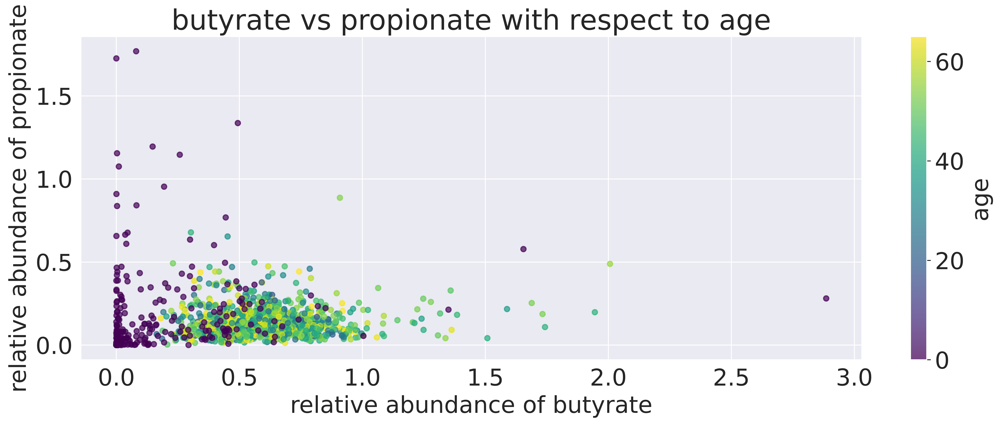

In [143]:
age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "age")
plt.show()

In [ ]:
age_graph_phyla = plotScatterContinuous(bacteroides_vs_firmicutes, "butyrate", "propionate", "age")
plt.show()

In [ ]:
bmi_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "BMI")
plt.show()

In [ ]:
country_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "country")

In [ ]:
gender_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "gender")

In [ ]:
age_category_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "age_category")

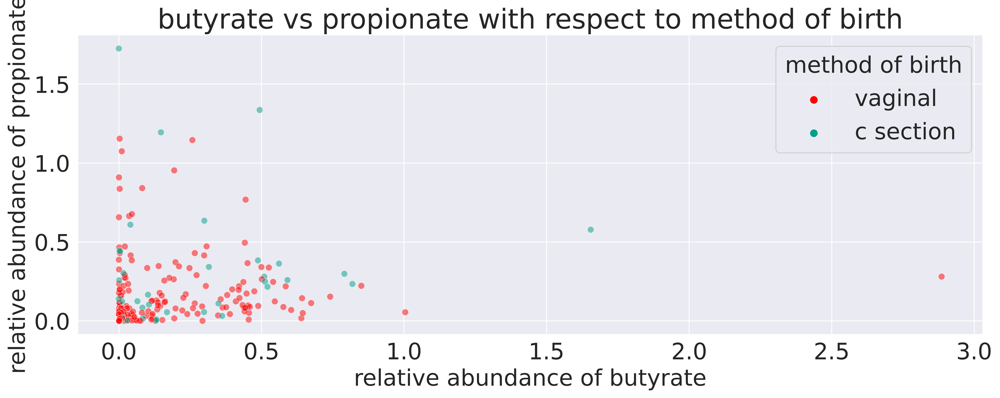

In [134]:
born_method_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "method of birth")

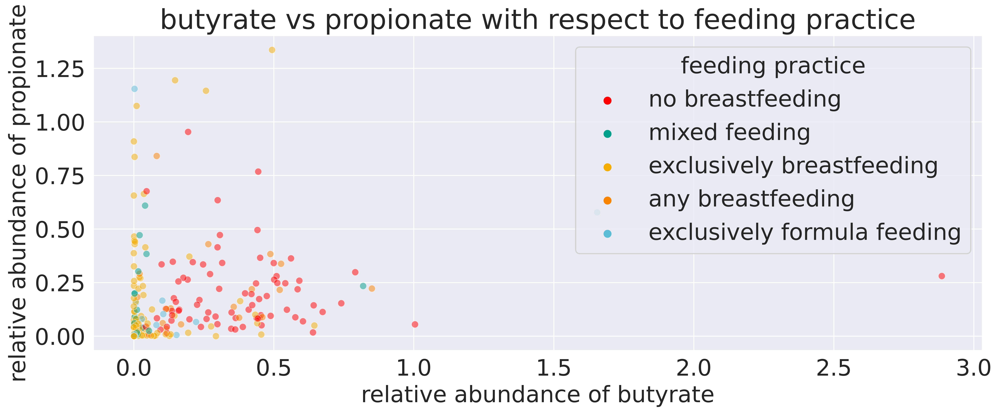

In [137]:
feeding_practice_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "feeding practice")

In [ ]:
pregnant_graph = plotScatterDiscrete(adult_health_prop_but_normalised, "butyrate", "propionate", "pregnant")

In [ ]:
disease_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "disease")

In [ ]:
lactating_graph = plotScatterDiscrete(adult_health_prop_but_normalised, "butyrate", "propionate", "lactating")

<Figure size 3840x2880 with 0 Axes>

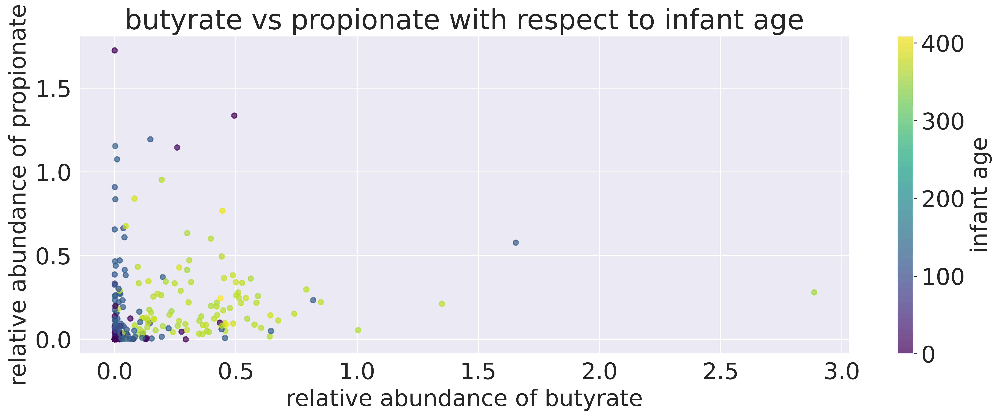

In [142]:
infant_age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "infant age")
plt.show()

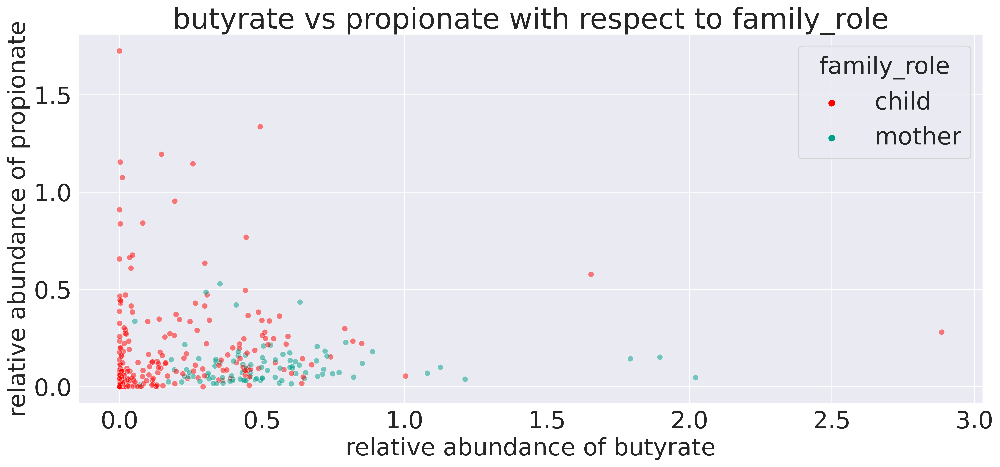

In [126]:
family_role_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "family_role")

<Figure size 3840x2880 with 0 Axes>

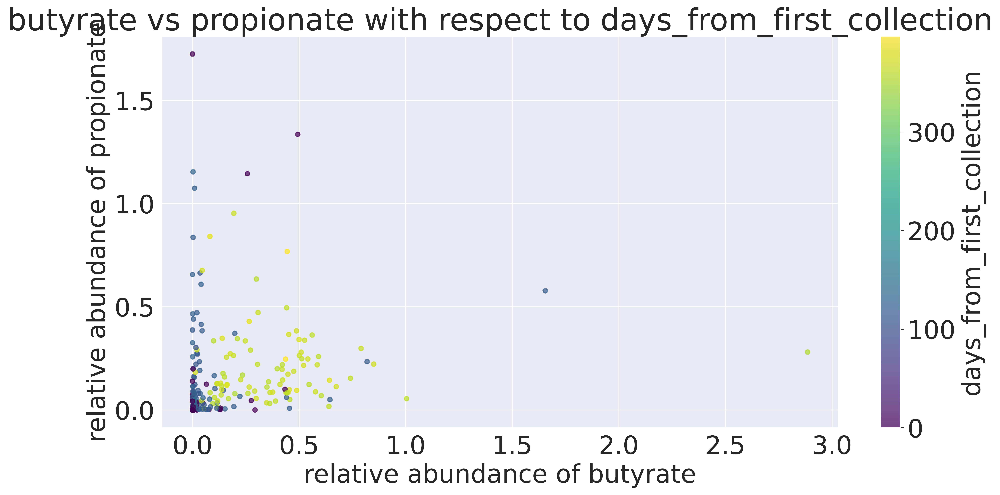

In [127]:
days_since_collection_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "days_from_first_collection")
plt.show()

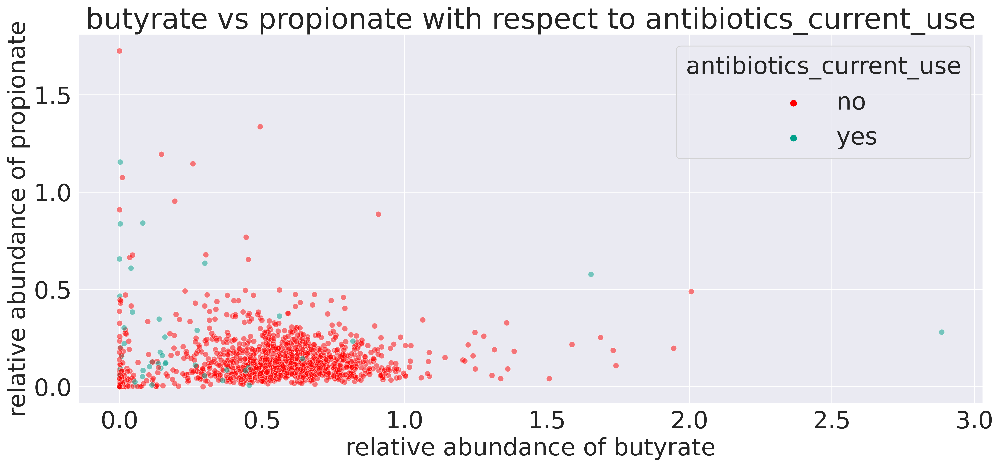

In [128]:
antibiotics_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "antibiotics_current_use")

In [ ]:
with_metadata_prop_but_normalised

In [ ]:
from matplotlib.legend_handler import HandlerTuple

In [ ]:
t24 = pd.read_csv("07.31.23_Analysis.csv")

t24 = t24.drop(["Gravitropism Angel"], axis=1).dropna(axis=0)

treatment_dict = {
    "IAA": "IAA INSERT REST OF TITLE",
    "ABA": "ABA INSERT REST OF TITLE",
    "MS": "MS INSERT REST OF TITLE"
}

In [ ]:
def graph_ratio(df, title, y_value , x_value, hue_value, log=False):
  sns.set_theme(style="ticks", palette="pastel")
  plt.rcParams['figure.dpi']=600
  ax = sns.boxplot(x=x_value, y=y_value, hue=hue_value, data=df)
  plt.xticks(rotation=90)
  ax.set_title(title)
  sns.stripplot(x=x_value, y=y_value, hue=hue_value, data=df, dodge=True, ax=ax)


  if log:
    plt.yscale("log")
    handles, labels = ax.get_legend_handles_labels()
    ax.set_title(title)
    ax.legend(handles=[(handles[0], handles[2]), (handles[1], handles[3])],
              labels=['Uninduced', 'Induced'],
              loc='upper right', handlelength=4,
              handler_map={tuple: HandlerTuple(ndivide=None)})


In [ ]:
t24

In [ ]:
for treatment in list(treatment_dict.keys()):

    y_list = ["Primary Root Growth (cm)", "Number Lateral Roots", "Average Lateral Length (cm)", "Number Leaves"]

    df = t24.loc[t24['Treatment'] == treatment]

    for y_data in y_list:

        graph_ratio(df, title=treatment_dict[treatment], y_value=y_data, x_value="Line", hue_value="Post-Transfer Day", log=False)

        plt.show()
